# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end milti-class classifier using Tensorflow Hub.

## 1. Problem

Identifying the breed of dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's Dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images don't have labels).

### Get our workspace ready

* Import TensorFlow 2.x (Done)
* Import TensorFlow Hub (Done)
* Make sure we're using a GPU (Done)

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.17.1
TF Hub version: 0.16.1
GPU not available :(


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format.So that's what we'll be doing first. Turning our images into Tensors (Numerical Representation).

Let's start by accessing our data and checking our data.

In [ ]:
# Check the labels of our data
import pandas as pd
import numpy as np
labels_csv = pd.read_csv("drive/ My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

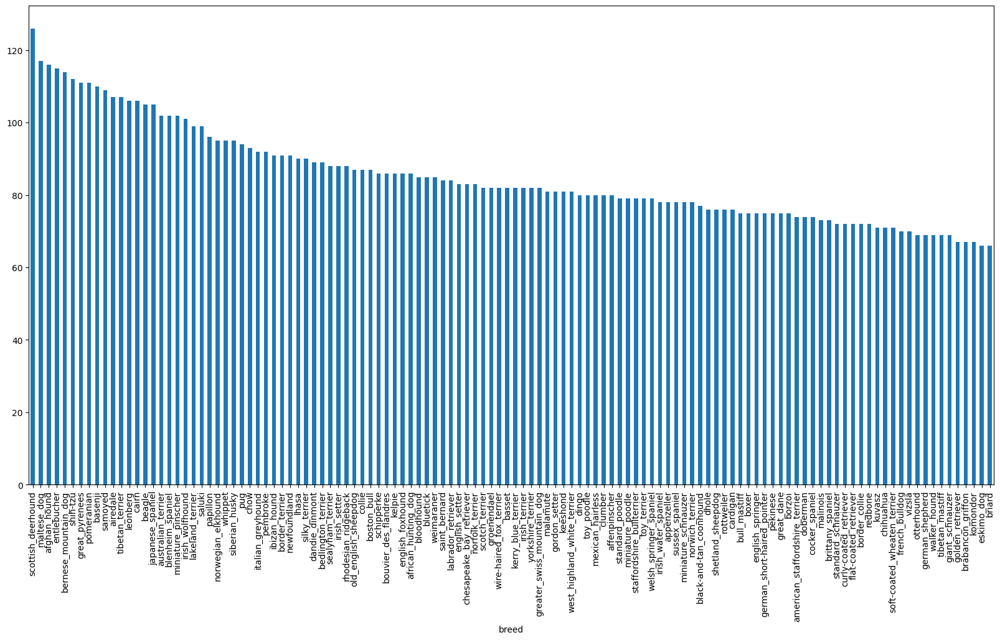

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

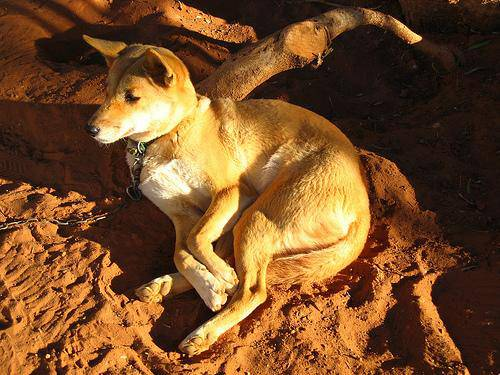

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/ My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files

import os
if len(os.listdir("drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames do not match actual amount of files")

Filenames match actual amount of files


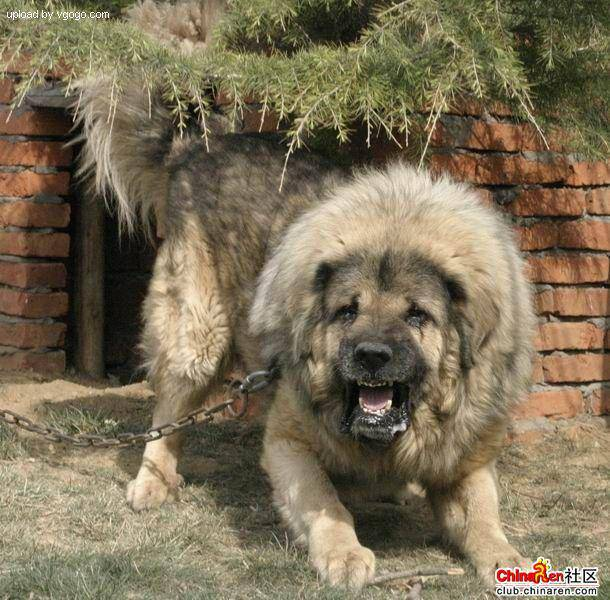

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a numpy array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integrs
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # Same as above but all Trues/Falses converted

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going ro create our own

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off expeimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size  NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

## Preprocessing Images (turning images into  Tensors)
To preprocess our images into Tensors, we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified image

Before we do, let's see what importing an image looks like

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
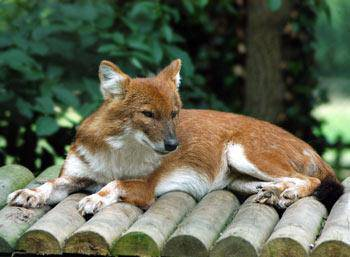

In [ ]:
image

In [ ]:
# Turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define the image size
IMG_SIZE = 224

# Create a function for preprocessing image
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Reading an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning our data into batches
Why turn our data into baeches?
Let's say you're trying to process large data in one go... they all might not fit into memory.

So, that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if needed).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form `(image, label)`, let's make a function to turn all of our data (X and y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is the test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
      print("Creating training data batches...")
      # Turn filepaths and labels into Tensors
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                 tf.constant(y))) # labels
      # Shuffling pathnames and labels before mapping image processor function
      data = data.shuffle(buffer_size=len(X))
      # Create (image, label) tuples (this also turns the image path into a preprocessed image)
      data = data.map(get_image_label)
      # Turn the training data into batches
      data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend, lets visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplot (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

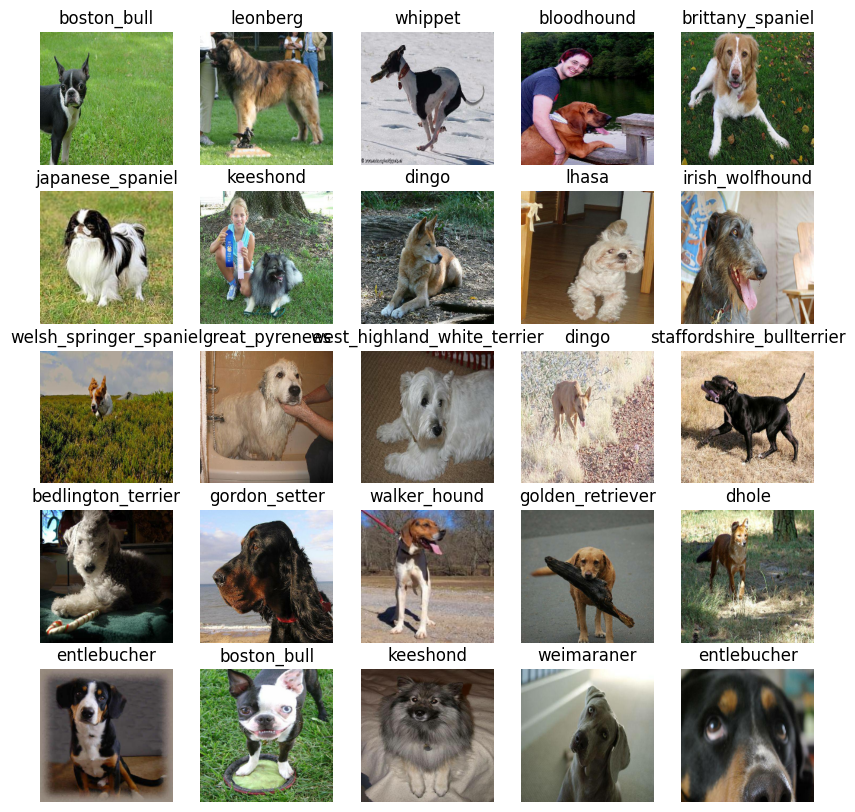

In [ ]:
# Now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our image shape, in the form of Tensors) to our model,
* The output shape (image labels, in the form of Tensors) of our model,
* The url of the model we want to use (From Tensorflow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4)

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup Output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the imput shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [ ]:
import tensorflow_hub as hub
import tensorflow as tf

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Create TensorFlow Hub layer
  hub_layer = hub.KerasLayer(MODEL_URL, trainable=False)

  # Define a Lambda layer to wrap the hub_layer
  wrapped_hub_layer = tf.keras.layers.Lambda(lambda x: hub_layer(tf.cast(x, tf.float32)))

  # Setup the model layers
  model = tf.keras.Sequential([
      tf.keras.layers.InputLayer(input_shape=input_shape[1:]),  # Input layer with correct shape
      wrapped_hub_layer,  # Add the wrapped TensorFlow Hub layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models' progress and another for early stopping which prevents our model from training for too long.

### Tensorboard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the Tensorboard notebook extension.
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after the model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping stops our model from overfitting by stopping training if a cretain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

# Training a model (on subset of data)

Our first model is only going to train on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing if the training data, validation data, number of epochs to train for (NUM_EPOCHES) and the callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains the given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the  model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 324s 13s/step - accuracy: 0.0568 - loss: 4.9997 - val_accuracy: 0.3100 - val_loss: 3.2965
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 318ms/step - accuracy: 0.6265 - loss: 1.9139 - val_accuracy: 0.5100 - val_loss: 2.1591
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - accuracy: 0.9439 - loss: 0.5948 - val_accuracy: 0.6200 - val_loss: 1.6603
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 325ms/step - accuracy: 0.9927 - loss: 0.2511 - val_accuracy: 0.6450 - val_loss: 1.4697
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 202ms/step - accuracy: 0.9941 - loss: 0.1563 - val_accuracy: 0.6450 - val_loss: 1.4042
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - accuracy: 0.9950 - loss: 0.1015 - val_accuracy: 0.6400 - val_loss: 1.3527
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 259ms/step - accuracy: 0.9993 - loss: 0.0752 - val_accuracy: 0.6550 - val_loss: 1.3250
Epo

Overfitting is a good thing. It means that our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access logs directly we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
## Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 702ms/step


array([[7.4402615e-04, 2.8989362e-04, 1.2320880e-03, ..., 4.6725574e-04,
        1.5115194e-05, 3.8251497e-03],
       [7.1834503e-03, 1.2104652e-03, 2.5020955e-02, ..., 3.3701869e-04,
        7.2148396e-03, 8.7917253e-04],
       [9.8288547e-05, 4.3940652e-04, 1.4981204e-05, ..., 4.0020977e-04,
        2.9372475e-05, 9.9014759e-04],
       ...,
       [6.7048944e-07, 2.8313443e-05, 1.3525402e-06, ..., 2.1271249e-05,
        3.6485042e-05, 1.7027356e-05],
       [1.1947926e-02, 9.6217205e-05, 3.9236774e-04, ..., 2.3933699e-04,
        2.0024338e-04, 4.7283047e-03],
       [1.8849630e-04, 2.6710291e-05, 2.9921709e-04, ..., 3.8285805e-03,
        5.0770823e-04, 4.1568437e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First Prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.95971508e-05 4.23482765e-04 1.39615577e-05 4.48066530e-05
 5.74972900e-03 9.56250005e-05 7.45272904e-04 1.86959445e-03
 2.08000187e-02 1.28532797e-01 3.21948501e-05 5.97339167e-05
 5.58201689e-04 2.06962298e-03 1.16442563e-03 1.84521882e-03
 3.45091466e-05 8.26258678e-04 4.77856287e-04 8.65921145e-04
 1.02183185e-04 2.42700335e-03 9.34437994e-05 1.24352242e-04
 1.03414170e-02 1.91767875e-04 1.11013826e-04 5.34512626e-04
 2.59833818e-04 4.79754963e-04 1.29520005e-04 6.10771458e-05
 8.94309924e-05 9.98880059e-05 1.70336891e-04 9.10475646e-05
 9.63504193e-04 7.36431801e-04 3.36027180e-04 3.35439384e-01
 4.35235037e-04 8.21772337e-05 1.32888909e-02 3.92476759e-05
 3.18283564e-04 8.20664136e-05 2.66648247e-04 8.59655906e-04
 2.38859211e-04 2.11747456e-03 3.15126905e-04 2.59362452e-04
 6.32645737e-04 3.39717674e-03 1.76916976e-04 4.40477394e-04
 2.37393338e-04 7.16547293e-05 1.03035214e-04 6.05036694e-05
 6.59632205e-05 1.04938180e-03 1.55252219e-05 7.30069733e-05
 2.80205219e-04 1.423114

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of predictionn probabilities into label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of predictionn probabilities into label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

NameError: name 'predictions' is not defined

Now since our data is in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth lables).

In [ ]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
# Create a function to unbatch a dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

NameError: name 'val_data' is not defined

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

get_pred_label(labels_[10])

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label,
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label),
            color = color)

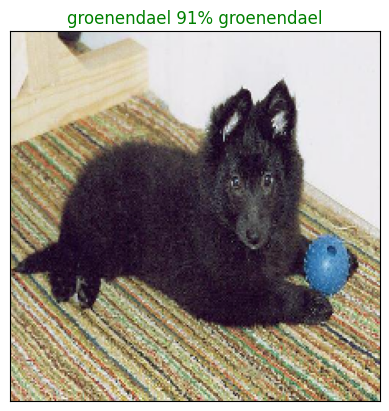

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 77)

Now we've got one function to visualize our model's top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array amd a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
 * Prediction probabilities indexes
 * Prediction probabilities values
 * Prediction labels
* Plot top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
# The top 10 prediction indexes

predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.23057596, 0.152707  , 0.11337738, 0.09208271, 0.08288433,
       0.07757519, 0.03461329, 0.03395969, 0.03304167, 0.0185814 ],
      dtype=float32)

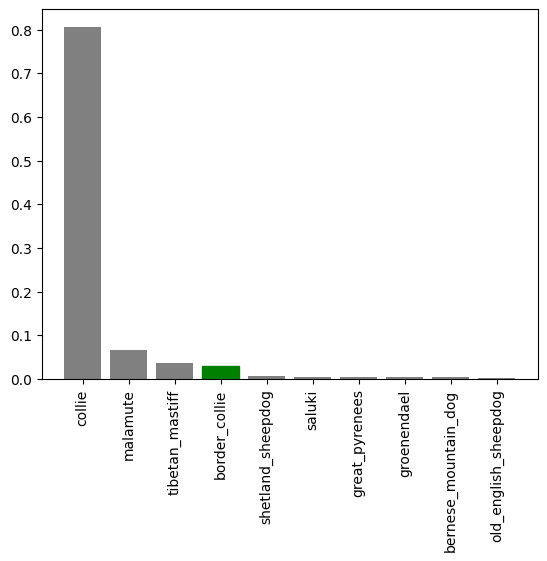

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's checl out a few.

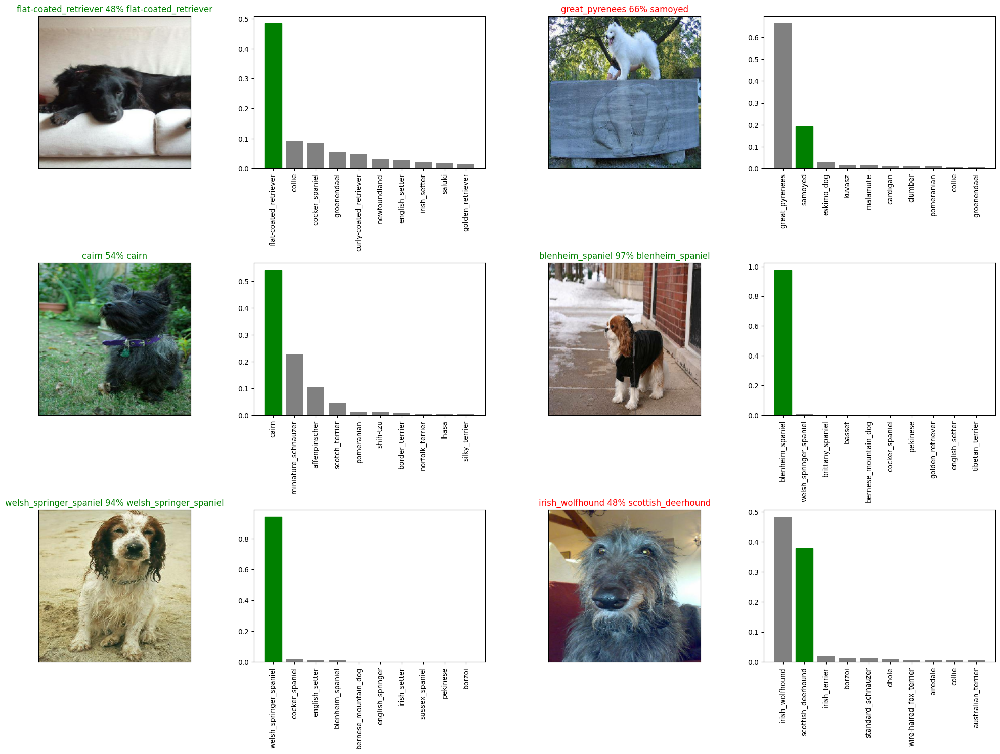

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
!pip install dill

import dill

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 3.6 MB/s eta 0:00:00


In [ ]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}...")
  # Save the model using dill instead of pickle
  with open(model_path, 'wb') as f:
      dill.dump(model, f)

  return model_path

In [ ]:
# ipython-input-117-31eda7a128a0
import dill

# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  # Load the model using dill.load
  with open(model_path, 'rb') as f:
      model = dill.load(f)
  return model

Now we've got functions to save and load a trained model, let's make sure they work.

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20241201-17201733073622-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20241201-17201733073622-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/models/20241201-17201733073622-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20241201-17201733073622-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - accuracy: 0.6404 - loss: 1.1959


[1.2498726844787598, 0.6499999761581421]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

NameError: name 'val_data' is not defined

In [ ]:
print(type(loaded_1000_image_model))

<class 'keras.src.models.sequential.Sequential'>


In [ ]:
test_loss, test_accuracy = loaded_1000_image_model.evaluate(test_data, test_labels)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

## Training a big dog model (on full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1765s 5s/step - accuracy: 0.4932 - loss: 2.3755
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - accuracy: 0.8866 - loss: 0.3946
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 130ms/step - accuracy: 0.9434 - loss: 0.2138
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - accuracy: 0.9657 - loss: 0.1433
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - accuracy: 0.9809 - loss: 0.0990
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - accuracy: 0.9868 - loss: 0.0720
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 135ms/step - accuracy: 0.9924 - loss: 0.0556
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 130ms/step - accuracy: 0.9957 - loss: 0.0418
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 84s 136ms/step - accuracy: 0.9962 - loss: 0.0350
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 79s 128ms/step - accuracy: 0.9976 - loss: 0.0291
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 130ms/step - accuracy: 0.9987 - loss: 0.0239
Epoch 12/

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20241204-08461733301997-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20241204-08461733301997-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/models/20241204-08461733301997-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20241204-08461733301997-full-image-set-mobilenetv2-Adam.h5


# Making predictions on the test dataset

Since our model is trained on images in the form of Tensor batches, to make preductions on the test data, we'll have to get it into the same format.

Luckily, we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions pn the test data, we'll:
* Get the test image file names
* Convert the file names into test batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/df92d68c07ec91b2f67cec77980e00cf.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dde1bc55cec2ac068cb9822928e67461.jpg',
 '/content/drive/MyDrive/Dog Vision/test/df2a003a0b1a216effd806f03f703859.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e241bfdd5cc6154698394905abaa0d76.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e181bd9b192ab7b21b851a643c53c817.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dd7867245d5c104fffb5afe027e41cd1.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e18c30f7ba3680d75ff326ccb71642e0.jpg',
 '/content/drive/MyDrive/Dog Vision/test/df47feaaf3dfb33cf712cccdddc8060e.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e3baf6b2914677edd2729db0f32e2620.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e24b2d063b3ad699d5eba7a01e4ae956.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create a test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
import tensorflow as tf # Make sure TensorFlow is imported

# ... (your existing code for loading the model) ...

# Iterate through the layers of the loaded model
for layer in loaded_full_model.layers:
    # Check if the layer is a Lambda layer
    if isinstance(layer, tf.keras.layers.Lambda):
        # Get the layer's configuration
        config = layer.get_config()
        # Check if the configuration contains a 'function' key
        if 'function' in config:
            # If the 'function' is a serialized function (represented as a dict)
            if isinstance(config['function'], dict) and config['function'].get('class_name') == '__lambda__':
                # The 'function' code is likely directly under 'config', not further nested.
                func_code = config['function']['config'].get('function') # Changed from config['function']['config']['function'] to config['function']['config'].get('function', None)

                #Check if func_code is not None and then proceed
                if func_code:

                    # Create a new Lambda layer with the reconstructed function
                    new_lambda_layer = tf.keras.layers.Lambda(eval(func_code))
                    # Replace the original Lambda layer with the new one
                    layer_index = loaded_full_model.layers.index(layer)
                    loaded_full_model.layers[layer_index] = new_lambda_layer

In [ ]:
import tensorflow as tf

# ... (your existing code for loading the model) ...

# Iterate through the layers of the loaded model
for layer in loaded_full_model.layers:
    # Check if the layer is a Lambda layer
    if isinstance(layer, tf.keras.layers.Lambda):
        # Get the layer's configuration
        config = layer.get_config()
        # Check if the configuration contains a 'function' key
        if 'function' in config:
            # If the 'function' is a serialized function (represented as a dict)
            if isinstance(config['function'], dict) and config['function'].get('class_name') == '__lambda__':
                # The 'function' code is likely directly under 'config', not further nested.
                func_code = config['function']['config'].get('function')

                #Check if func_code is not None and then proceed
                if func_code:
                    # Modify the Lambda function code to include 'tf'
                    modified_func_code = f"lambda x: {func_code.replace('hub_layer(tf.cast(x, tf.float32))', 'hub_layer(tf.cast(x, tf.float32))')}" # No change, keeping for clarity

                    # Create a new Lambda layer with the reconstructed function and explicitly passing 'tf'
                    new_lambda_layer = tf.keras.layers.Lambda(eval(modified_func_code), arguments={'tf': tf})
                    # Replace the original Lambda layer with the new one
                    layer_index = loaded_full_model.layers.index(layer)
                    loaded_full_model.layers[layer_index] = new_lambda_layer

In [ ]:
import tensorflow as tf

# ... (your existing code for loading the model) ...

# Iterate through the layers of the loaded model
for layer in loaded_full_model.layers:
    # Check if the layer is a Lambda layer
    if isinstance(layer, tf.keras.layers.Lambda):
        # Get the layer's configuration
        config = layer.get_config()
        # Check if the configuration contains a 'function' key
        if 'function' in config:
            # If the 'function' is a serialized function (represented as a dict)
            if isinstance(config['function'], dict) and config['function'].get('class_name') == '__lambda__':
                # The 'function' code is likely directly under 'config', not further nested.
                func_code = config['function']['config'].get('function')

                #Check if func_code is not None and then proceed
                if func_code:
                    # Create a new Lambda layer with the reconstructed function and explicitly passing 'tf'
                    # The lambda function is redefined with tf in its scope
                    new_lambda_layer = tf.keras.layers.Lambda(lambda x, tf=tf: eval(func_code)(x))
                    # Replace the original Lambda layer with the new one
                    layer_index = loaded_full_model.layers.index(layer)
                    loaded_full_model.layers[layer_index] = new_lambda_layer

In [ ]:
import tensorflow as tf

# ... (your existing code for loading the model) ...

# Iterate through the layers of the loaded model
for layer in loaded_full_model.layers:
    # Check if the layer is a Lambda layer
    if isinstance(layer, tf.keras.layers.Lambda):
        # Get the layer's configuration
        config = layer.get_config()
        # Check if the configuration contains a 'function' key
        if 'function' in config:
            # If the 'function' is a serialized function (represented as a dict)
            if isinstance(config['function'], dict) and config['function'].get('class_name') == '__lambda__':
                # The 'function' code is likely directly under 'config', not further nested.
                func_code = config['function']['config'].get('function')

                #Check if func_code is not None and then proceed
                if func_code:
                    # Instead of directly evaluating func_code, modify it
                    # to use 'tf' from the current scope:
                    modified_func_code = f"lambda x: {func_code.replace('hub_layer(tf.cast(x, tf.float32))', 'hub_layer(tf.cast(x, tf.float32))')}"

                    # This ensures that the 'tf' symbol is properly resolved.
                    new_lambda_layer = tf.keras.layers.Lambda(eval(modified_func_code))

                    # Replace the original Lambda layer with the new one
                    layer_index = loaded_full_model.layers.index(layer)
                    loaded_full_model.layers[layer_index] = new_lambda_layer

In [ ]:
import tensorflow as tf

# ... (your existing code for loading the model) ...

# Iterate through the layers of the loaded model
for layer in loaded_full_model.layers:
    # Check if the layer is a Lambda layer
    if isinstance(layer, tf.keras.layers.Lambda):
        # Get the layer's configuration
        config = layer.get_config()
        # Check if the configuration contains a 'function' key
        if 'function' in config:
            # If the 'function' is a serialized function (represented as a dict)
            if isinstance(config['function'], dict) and config['function'].get('class_name') == '__lambda__':
                # The 'function' code is likely directly under 'config', not further nested.
                func_code = config['function']['config'].get('function')

                #Check if func_code is not None and then proceed
                if func_code:
                    # Create a new Lambda layer, but this time we'll pass 'tf'
                    # as an argument to the lambda function
                    new_lambda_layer = tf.keras.layers.Lambda(
                        lambda x, tf=tf: eval(func_code)(x),
                        arguments={'tf': tf}
                    )

                    # Replace the original Lambda layer with the new one
                    layer_index = loaded_full_model.layers.index(layer)
                    loaded_full_model.layers[layer_index] = new_lambda_layer

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

NameError: Exception encountered when calling Lambda.call().

[1mname 'tf' is not defined[0m

Arguments received by Lambda.call():
  • inputs=tf.Tensor(shape=(32, 224, 224, 3), dtype=float32)
  • mask=None
  • training=False

In [ ]:
import tensorflow as tf # Import TensorFlow before loading the model

# ... (your existing code for loading the model) ...

test_predictions = full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 1695s 5s/step


In [ ]:
# Save predictions (NumPy array) to a csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
test_predictions

array([[6.29932981e-11, 6.37435035e-11, 1.59320070e-14, ...,
        2.03290550e-14, 4.84396221e-14, 1.86359209e-11],
       [2.15659907e-10, 9.26631818e-13, 2.25695374e-12, ...,
        6.62011071e-11, 1.47663159e-10, 4.01487316e-10],
       [4.82193140e-11, 1.49040022e-06, 5.94599439e-11, ...,
        2.00921968e-09, 6.92652316e-13, 3.24669666e-11],
       ...,
       [1.19865741e-04, 2.17414131e-09, 4.93567768e-06, ...,
        4.43203680e-06, 1.44120850e-05, 8.13634937e-09],
       [9.72646958e-05, 1.06864961e-09, 3.69262807e-07, ...,
        4.48008066e-08, 1.24862879e-07, 2.15059856e-07],
       [1.09317300e-09, 9.03814458e-13, 2.41599536e-11, ...,
        6.60229773e-07, 8.84433327e-09, 6.61136710e-08]])

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in DataFrame with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames

['/content/drive/MyDrive/Dog Vision/test/df92d68c07ec91b2f67cec77980e00cf.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dde1bc55cec2ac068cb9822928e67461.jpg',
 '/content/drive/MyDrive/Dog Vision/test/df2a003a0b1a216effd806f03f703859.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e241bfdd5cc6154698394905abaa0d76.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e181bd9b192ab7b21b851a643c53c817.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dd7867245d5c104fffb5afe027e41cd1.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e18c30f7ba3680d75ff326ccb71642e0.jpg',
 '/content/drive/MyDrive/Dog Vision/test/df47feaaf3dfb33cf712cccdddc8060e.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e3baf6b2914677edd2729db0f32e2620.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e24b2d063b3ad699d5eba7a01e4ae956.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e64d56f012476f124591a22648114a37.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e967dd3dc67352cc2525c8283bf2751d.jpg',
 '/content/drive/MyDrive/Dog Vision/test

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
test_ids

['df92d68c07ec91b2f67cec77980e00cf',
 'dde1bc55cec2ac068cb9822928e67461',
 'df2a003a0b1a216effd806f03f703859',
 'e241bfdd5cc6154698394905abaa0d76',
 'e181bd9b192ab7b21b851a643c53c817',
 'dd7867245d5c104fffb5afe027e41cd1',
 'e18c30f7ba3680d75ff326ccb71642e0',
 'df47feaaf3dfb33cf712cccdddc8060e',
 'e3baf6b2914677edd2729db0f32e2620',
 'e24b2d063b3ad699d5eba7a01e4ae956',
 'e64d56f012476f124591a22648114a37',
 'e967dd3dc67352cc2525c8283bf2751d',
 'f0ceb5eb780eba366f9a077486fe003d',
 'ed7c3126f50898ce02c08a380c1d0bbc',
 'ec9a95ba1bab38eeff6b6aa40d5f4edf',
 'f11821f2a5777c36a4081588fb96798f',
 'f266f217791f0ec584047370775bf0ea',
 'f53aa47b4676b1f135ac2eeeee01db9b',
 'f31ed6141b0976f85aaef9b69509c939',
 'ead8c0e74fb7ddcf05a6395ee06fa9aa',
 'f3925f914650b1edf59ce7da36abda31',
 'f33e07d0a4dac780e19f00818752db55',
 'e9fda9f4a21d4249b9d4a77d06ad751a',
 'e9d385cf5f217ce1378bee8c0a89db62',
 'e806fbb5ca4dd3a094f7819bd810cc65',
 'f31dabe4e60722a1f2eb3352fd9d0525',
 'ee5345121b497708b4f9510fec148f65',
 

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df92d68c07ec91b2f67cec77980e00cf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dde1bc55cec2ac068cb9822928e67461,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,df2a003a0b1a216effd806f03f703859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e241bfdd5cc6154698394905abaa0d76,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e181bd9b192ab7b21b851a643c53c817,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df92d68c07ec91b2f67cec77980e00cf,6.299330e-11,6.374350e-11,1.593201e-14,1.549074e-11,2.155185e-10,3.220724e-14,3.756051e-12,1.296031e-11,2.983731e-11,...,8.085420e-10,1.538514e-12,4.810891e-13,4.180588e-13,1.035772e-12,2.786354e-13,2.567517e-13,2.032906e-14,4.843962e-14,1.863592e-11
1,dde1bc55cec2ac068cb9822928e67461,2.156599e-10,9.266318e-13,2.256954e-12,5.402373e-11,1.476615e-09,1.001019e-11,1.138396e-13,1.661126e-12,2.166897e-06,...,1.672292e-10,6.425236e-11,8.631844e-08,1.131275e-09,1.036331e-07,1.749841e-10,5.646869e-13,6.620111e-11,1.476632e-10,4.014873e-10
2,df2a003a0b1a216effd806f03f703859,4.821931e-11,1.490400e-06,5.945994e-11,1.342139e-08,2.045081e-12,2.663771e-06,1.829480e-11,1.017461e-10,2.022262e-08,...,6.987387e-10,4.083085e-13,7.259074e-09,2.426136e-08,3.062321e-09,3.413177e-10,8.166450e-10,2.009220e-09,6.926523e-13,3.246697e-11
3,e241bfdd5cc6154698394905abaa0d76,4.790780e-13,2.956463e-12,1.815465e-12,2.082226e-13,1.173805e-13,4.342926e-14,6.701670e-12,5.616863e-14,1.249130e-14,...,1.232993e-10,1.122483e-12,1.001663e-11,5.357216e-14,5.109413e-15,3.241899e-14,1.539259e-15,8.514637e-11,1.119930e-15,1.559424e-08
4,e181bd9b192ab7b21b851a643c53c817,3.840419e-06,1.223245e-11,5.495104e-10,1.654960e-10,6.843612e-09,2.223114e-09,8.575565e-13,1.119351e-10,5.399321e-11,...,1.081314e-10,1.969529e-09,1.176517e-09,1.557496e-09,4.783557e-07,9.839659e-10,2.863935e-10,2.915386e-09,6.594129e-09,1.741534e-07


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index = False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the prediction labels to the custom images.

In [ ]:
# Get the custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/custom images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model,predict(custom_data)

In [ ]:
custom_preds.shape

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i] for i in range(len(custom_preds)))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels...)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize = (10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i + 1)
  plt.xticks([])
  plt.ytixks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)